# INF552 Assignment4 LASSO, Boosting and Tree-based Methods
### Tong Lyu 1076139647
## 1 Introduction
### 1.1 Libraries

In [119]:
import numpy as np;
import pandas as pd;
import seaborn as sns;
import matplotlib.pyplot as plt;
import statsmodels.formula.api as smf
import statsmodels.api as sm
import statistics
import bootstrapped.bootstrap as bs
import bootstrapped.stats_functions as bs_stats
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import roc_curve, auc
from sklearn import preprocessing
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from imblearn.over_sampling import SMOTE 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor

from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn import model_selection
from matplotlib.ticker import MultipleLocator
from itertools import cycle
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

## 2. The LASSO and Boosting for Regression
### 2.1 Data imputation (1b)

In [120]:
# 1b Data imputation
attrs = []
f = open("./data/communities.names.txt","r")
for line in f.readlines()[80:203]:
    if (line.startswith("@attribute")):
        words = line.split(" ")
        attrs.append(words[1])
f.close()
reg_input_data = pd.read_csv("./data/communities.csv", sep=",",header=None).drop([0,1,2,3,4],axis=1)
reg_data = reg_input_data.replace('?',np.nan)
reg_data = reg_data.apply(pd.to_numeric, errors='ignore')
reg_data = reg_data.fillna(value=reg_data.mean())
reg_data.columns= range(0,123)
print(reg_data)

# imp_mean = SimpleImputer(missing_values=-1, strategy='mean')
# reg_data = pd.DataFrame(imp_mean.fit_transform(reg_input_data))

       0     1     2     3     4     5     6     7     8     9    ...    113  \
0     0.19  0.33  0.02  0.90  0.12  0.17  0.34  0.47  0.29  0.32  ...   0.12   
1     0.00  0.16  0.12  0.74  0.45  0.07  0.26  0.59  0.35  0.27  ...   0.02   
2     0.00  0.42  0.49  0.56  0.17  0.04  0.39  0.47  0.28  0.32  ...   0.01   
3     0.04  0.77  1.00  0.08  0.12  0.10  0.51  0.50  0.34  0.21  ...   0.02   
4     0.01  0.55  0.02  0.95  0.09  0.05  0.38  0.38  0.23  0.36  ...   0.04   
5     0.02  0.28  0.06  0.54  1.00  0.25  0.31  0.48  0.27  0.37  ...   0.01   
6     0.01  0.39  0.00  0.98  0.06  0.02  0.30  0.37  0.23  0.60  ...   0.05   
7     0.01  0.74  0.03  0.46  0.20  1.00  0.52  0.55  0.36  0.35  ...   0.01   
8     0.03  0.34  0.20  0.84  0.02  0.00  0.38  0.45  0.28  0.48  ...   0.04   
9     0.01  0.40  0.06  0.87  0.30  0.03  0.90  0.82  0.80  0.39  ...   0.00   
10    0.13  0.71  0.15  0.07  1.00  0.41  0.40  0.52  0.35  0.33  ...   0.02   
11    0.02  0.46  0.08  0.91  0.07  0.10

### 2.2 Plot a correlation matrix (1c)

In [121]:
# 1c Plot a correlation matrix
corr = reg_data.corr()
corr.style.background_gradient()

### 2.3 Coeﬃcient of Variation CV for each feature (1d)

In [122]:
#1d Coeﬃcient of Variation (CV = s/m)
var = reg_data.var()
mean = reg_data.mean()
CV = var / mean
print(pd.DataFrame(CV, columns=["CV"]))

           CV
0    0.279637
1    0.057841
2    0.357587
3    0.079015
4    0.283898
5    0.375306
6    0.056777
7    0.041733
8    0.082446
9    0.075875
10   0.256736
11   0.284167
12   0.121379
13   0.059942
14   0.142881
15   0.063970
16   0.063981
17   0.155280
18   0.058587
19   0.104626
20   0.104275
21   0.094813
22   0.101149
23   0.133416
24   0.118457
25   0.128067
26   0.086773
27   0.294900
28   0.172265
29   0.144146
..        ...
93   0.061468
94   0.064188
95   0.060307
96   0.043774
97   0.018767
98   0.003018
99   0.015571
100  0.042694
101  0.020093
102  0.018053
103  0.018767
104  0.011906
105  0.010760
106  0.040401
107  0.045539
108  0.071802
109  0.031347
110  0.030490
111  0.011846
112  0.026843
113  0.183676
114  0.177134
115  0.324496
116  0.045127
117  0.040890
118  0.010454
119  0.059659
120  0.614103
121  0.022192
122  0.228096

[123 rows x 1 columns]


### 2.4 Scatter plots and box plots for 11 features (1e)

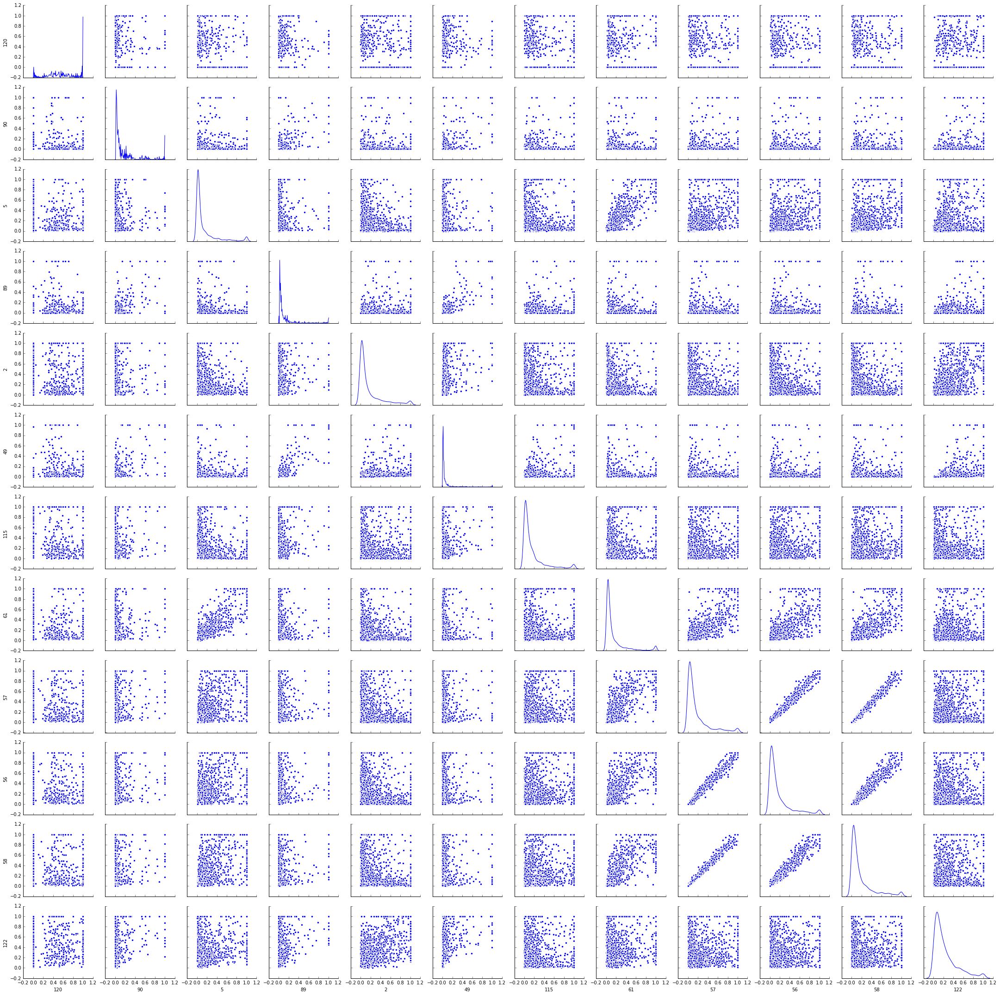

In [123]:
#1e
# Pick 11 features with highest CV
reg_first_11 = np.argsort(-CV)[0:11].append(pd.Series([122]))
reg_first_11_data = reg_data[reg_first_11]

# make scatter plots and box plots
plt.figure(figsize=(10,10))
sns.pairplot(reg_first_11_data,diag_kind='kde')
plt.show()

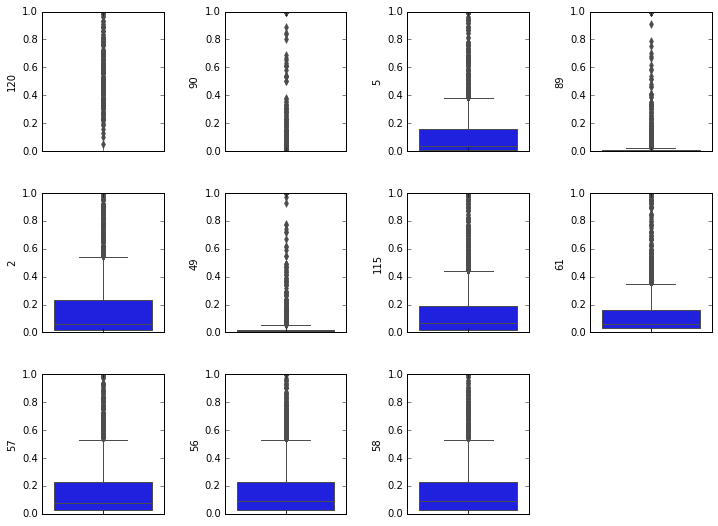

In [124]:
plt.figure(figsize=(12,9))
plt.subplots_adjust(hspace=0.3, wspace=0.5)
arrange = 0
for attr in reg_first_11:
    if attr != 122:
        arrange += 1
        plt.subplot(3,4,arrange)
        sns.boxplot(data=reg_first_11_data,y=attr)

#### Summary
From the sactter plot, we can find that No. 56,57,58 features may have multicollinearity， which may cause a low significance for these 3 features. And for No. 2,5,115,61 features, they have a relative low correlation with depenedent variables. While for No.120,90,89,49, it seems there are no relations with depenedent variables.

### 2.5 Linear model using least squares (1f)

In [125]:
#1f Linear model using least squares
reg_train_data = reg_data.loc[:1494]
reg_test_data = reg_data.loc[1495:]
train_X = reg_train_data.drop([122],axis=1)
train_Y = reg_train_data[122]
test_X = reg_test_data.drop([122],axis=1)
test_Y = reg_test_data[122]

reg_linear_model = LinearRegression().fit(train_X,train_Y)
reg_linear_pred = reg_linear_model.predict(test_X)
reg_linear_err = mean_squared_error(test_Y,reg_linear_pred)
print("MSE for linear regression model is %.5f" % reg_linear_err)

MSE for linear regression model is 0.78973


### 2.6 A ridge regression model (1g)

In [126]:
#1g ridge regression model
# alphas = 10**np.linspace(-3,3,100)
alphas = [0.001,0.01,0.1,1]
reg_ridge_model = RidgeCV(alphas=alphas, cv = 10).fit(train_X,train_Y)
reg_linear_pred = reg_ridge_model.predict(test_X)
reg_linear_err = mean_squared_error(test_Y,reg_linear_pred)
reg_ridge_alpha = reg_ridge_model.alpha_
print("MSE for ridge regression model (best lamda = %.2f) is %.5f" % (reg_ridge_alpha,reg_linear_err))

MSE for ridge regression model (best lamda = 1.00) is 0.01774


### 2.7 A LASSO model (1h)

In [127]:
#1h lasso model
reg_lasso_model = LassoCV(alphas=alphas, cv = 10, random_state=0).fit(train_X,train_Y)
reg_lasso_pred = reg_lasso_model.predict(test_X)
reg_lasso_err = mean_squared_error(test_Y,reg_lasso_pred)
reg_lasso_alpha = reg_lasso_model.alpha_
print("MSE for lasso model (best lamda = %.2f) is %.5f" % (reg_lasso_alpha, reg_lasso_err))
reg_lasso_nor_model = LassoCV(alphas=alphas, cv = 10, random_state=0, normalize=True).fit(train_X,train_Y)
reg_lasso_nor_pred = reg_lasso_nor_model.predict(test_X)
reg_lasso_nor_err = mean_squared_error(test_Y,reg_lasso_nor_pred)
reg_lasso_nor_alpha = reg_lasso_nor_model.alpha_
print("MSE for lasso model with normalized features (best lamda = %.2f) is %.5f" % (reg_lasso_nor_alpha, reg_lasso_nor_err))

MSE for lasso model (best lamda = 0.00) is 0.01755
MSE for lasso model with normalized features (best lamda = 0.00) is 0.01977


### 2.8 Priciple Component Regression model (1i)

In [128]:
#1i PCR
pcr_mse = []
for i in np.arange(1, 123):
    pca = PCA(n_components=i)
    X_reduced_train = pca.fit_transform(scale(train_X))
    regr = LinearRegression()
    com_score = (model_selection.cross_validate(regr, X_reduced_train, train_Y,cv=10,scoring='neg_mean_squared_error',\
                                                return_train_score=True)['test_score']*(-1)).mean()
    pcr_mse.append(com_score)
pcr_M = pcr_mse.index(min(pcr_mse)) + 1
print("Lowest cross-validation error occurs when M = %d components are used." % (pcr_M))

Lowest cross-validation error occurs when M = 95 components are used.


In [129]:
X_reduced_test = pca.transform(scale(test_X))

# Train regression model on test data
pca = PCA(n_components=pcr_M)
reg_pcr_model = LinearRegression().fit(X_reduced_test,test_Y)
reg_pcr_pred = reg_pcr_model.predict(X_reduced_test)
reg_pcr_err = mean_squared_error(test_Y,reg_pcr_pred)
print("MSE for priciple component regression (M = %d) is %.5f" % (pcr_M,reg_pcr_err))

MSE for priciple component regression (M = 95) is 0.01089


### 2.9 XGBoost Tree (1j)

In [130]:
from xgboost import XGBRegressor
#1j  L1-penalized regression
bs_score=[]
for a in alphas:
    param = {'max_depth':2, 'reg_alpha':a, 'silent':1, 'objective':'reg:logistic'}
    boosting = XGBRegressor(**param)
    cv_score = (model_selection.cross_validate(boosting, train_X, train_Y, cv = 10, \
                                               return_train_score=True)['test_score']*(-1)).mean()
    bs_score.append(cv_score)
bs_alpha = alphas[bs_score.index(max(bs_score))]
param = {'max_depth':2, 'reg_alpha':bs_alpha, 'silent':1, 'objective':'reg:logistic'}
boosting = XGBRegressor(**param)
boosting_model = boosting.fit(train_X,train_Y)
boosting_pred = boosting.predict(test_X)
boosting_err = mean_squared_error(test_Y,boosting_pred)
print("MSE for boosting tree (best lamda = %.2f) is %.5f" % (bs_alpha, boosting_err))

MSE for boosting tree (best lamda = 0.01) is 0.01588


## 3. Tree-Based Methods
### 3.1 Data Preparation (2b)

In [131]:
#2b Data Preparation
#bi data imputation
tree_input_train = pd.read_csv("./data/aps_failure_training_set.csv", sep=",",header=14)
tree_train = tree_input_train.replace('na',np.nan)
tree_input_test = pd.read_csv("./data/aps_failure_test_set.csv", sep=",",header=14)
tree_test = tree_input_test.replace('na',np.nan)

tree_train = tree_train.apply(pd.to_numeric, errors='ignore')
tree_train = tree_train.fillna(value=tree_train.mean())
tree_test = tree_test.apply(pd.to_numeric, errors='ignore')
tree_test = tree_test.fillna(value=tree_test.mean())

In [132]:
#bii coeﬃcient of variation CV
tree_data = pd.concat([tree_train,tree_test])

tree_var = tree_data.var()
tree_mean = tree_data.mean()
tree_CV = tree_var / tree_mean
print(pd.DataFrame(tree_CV, columns=["CV"]))

                  CV
aa_000  1.145941e+06
ab_000  3.443195e+00
ac_000  1.674807e+09
ad_000  6.439026e+09
ae_000  3.348370e+03
af_000  3.593046e+03
ag_000  1.676702e+06
ag_001  2.133541e+06
ag_002  3.012530e+06
ag_003  7.175228e+06
ag_004  1.343976e+07
ag_005  9.863614e+06
ag_006  9.222242e+06
ag_007  3.961358e+06
ag_008  1.403490e+06
ag_009  5.438159e+06
ah_000  9.826011e+06
ai_000  3.286940e+06
aj_000  2.172690e+06
ak_000  5.989671e+06
al_000  5.115063e+06
am_0    7.994962e+06
an_000  1.780106e+07
ao_000  1.574718e+07
ap_000  9.707083e+06
aq_000  3.657461e+06
ar_000  5.505923e+01
as_000  3.208111e+06
at_000  2.793981e+06
au_000  2.222861e+06
...              ...
dl_000  4.050686e+07
dm_000  9.361509e+06
dn_000  2.831083e+05
do_000  1.362156e+05
dp_000  2.838168e+04
dq_000  1.954760e+09
dr_000  8.810305e+06
ds_000  4.742996e+05
dt_000  7.278836e+04
du_000  3.221884e+07
dv_000  7.203014e+06
dx_000  2.057709e+07
dy_000  4.430074e+05
dz_000  5.004172e+02
ea_000  1.649716e+03
eb_000  2.047

In [133]:
# biii Plot a correlation matrix
tree_corr = tree_data.corr()
tree_corr.style.background_gradient()

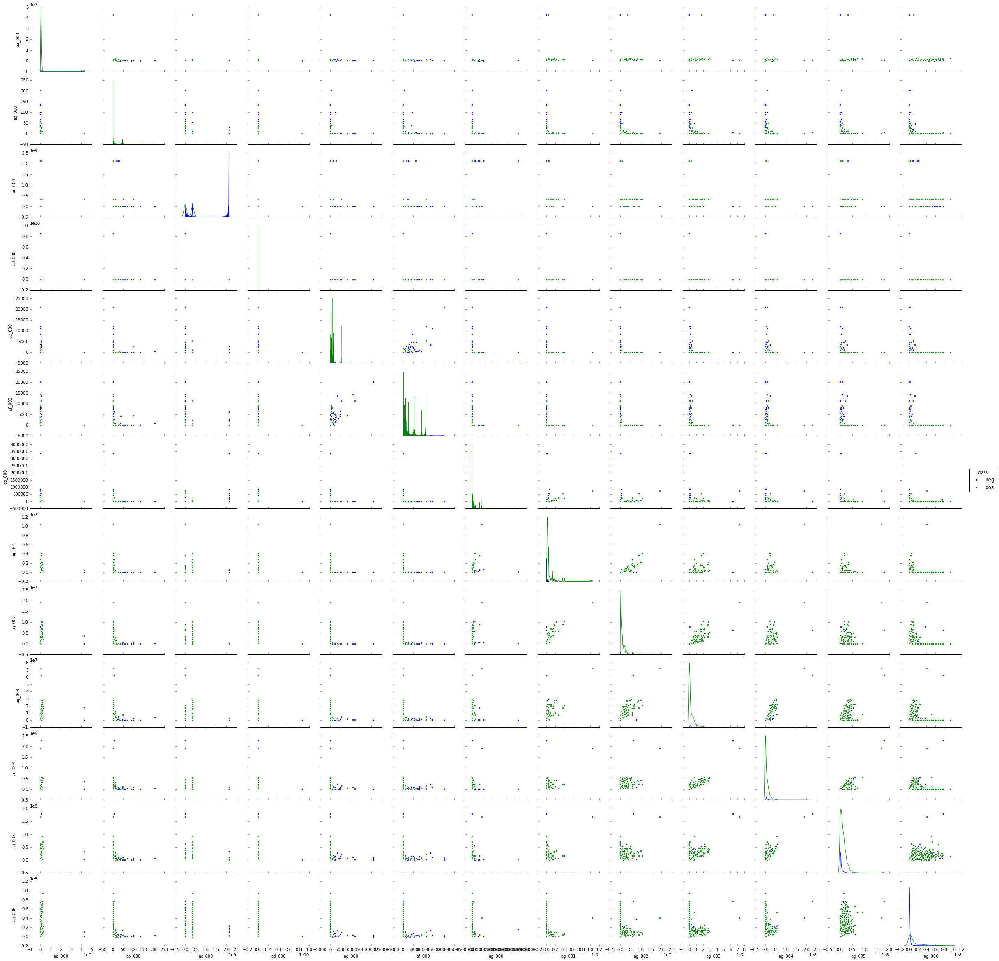

In [134]:
# biv 
# Pick 13 features with highest CV
tree_first_13 = np.argsort(-tree_CV)[0:13]
tree_first_13 = list(tree_first_13.index)
tree_first_13_data = tree_data[tree_first_13]
tree_first_13_data['class'] = tree_data['class']

# make scatter plots
plt.figure(figsize=(12,12))
sns.pairplot(tree_first_13_data,diag_kind='kde',hue='class')
plt.show()

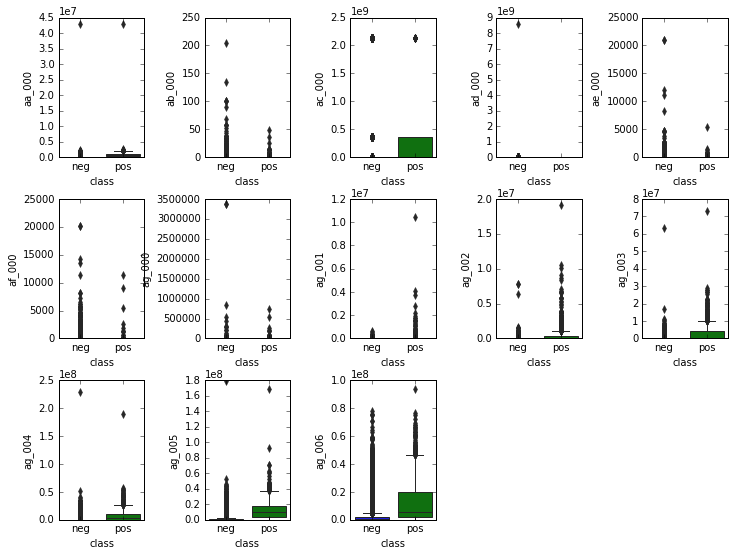

In [135]:
# make box plots
plt.figure(figsize=(12,9))
plt.subplots_adjust(hspace=0.3, wspace=0.7)
arrange = 0
for attr in tree_first_13:
    arrange += 1
    plt.subplot(3,5,arrange)
    sns.boxplot(data=tree_first_13_data,x='class',y=attr)

In [136]:
# bv
pos_data = tree_data[tree_data["class"]=="pos"]
pos_number = pos_data.shape[0]
neg_data = tree_data[tree_data["class"]=="neg"]
neg_number = neg_data.shape[0]
print("For the whole datasets (%d rows), there are %d positive data and %d negative data. \
So the dataset is imbalanced." %(tree_data.shape[0],pos_number,neg_number))

For the whole datasets (76000 rows), there are 1375 positive data and 74625 negative data. So the dataset is imbalanced.


### 3.2 Random forest (2c)

The confusion matrix of training dataset (random forest):
			| predicted Positive 	| predicted Negative
real Positive		| 188			| 812
real Negotiate		| 22			| 58978

The ROC curve of random forest model for training dataset is as follows, and the AUC = 0.97


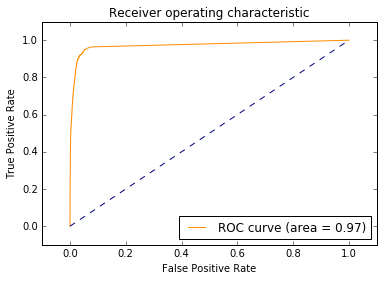


The misclassification rate for training dataset is 0.01390


In [163]:
#2c random forest
from sklearn.ensemble import RandomForestClassifier
tree_train = tree_train.replace('pos',1)
tree_train = tree_train.replace('neg',0)
tree_test = tree_test.replace('pos',1)
tree_test = tree_test.replace('neg',0)

x_tree_train = tree_train.drop(['class'], axis=1)
y_tree_train = tree_train['class']
x_tree_test = tree_test.drop(['class'], axis=1)
y_tree_test = tree_test['class']

rf_model = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0,oob_score=True)
rf_model.fit(x_tree_train, y_tree_train)

#training dataset
rf_pred_train = rf_model.predict(x_tree_train)
#Confusion matrix
rf_cm_train = confusion_matrix(y_tree_train, rf_pred_train)
TP = rf_cm_train[1][1]
FP = rf_cm_train[0][1]
TN = rf_cm_train[0][0]
FN = rf_cm_train[1][0]
print("The confusion matrix of training dataset (random forest):")
print("\t\t\t| predicted Positive \t| predicted Negative")
print("real Positive\t\t| "+str(TP)+"\t\t\t| "+str(FN))
print("real Negotiate\t\t| "+str(FP) +"\t\t\t| "+str(TN))

#ROC
fpr, tpr, thresholds = roc_curve(y_tree_train, rf_model.predict_proba(x_tree_train)[:,1])
print("\nThe ROC curve of random forest model for training dataset is as follows, and the AUC = %.2f"% auc(fpr,tpr))
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % auc(fpr,tpr))
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# misclassification rate
mis_rate_train = 1 - rf_model.score(x_tree_train, y_tree_train)
print("\nThe misclassification rate for training dataset is %.5f" % mis_rate_train)

The confusion matrix of test dataset (random forest):
			| predicted Positive 	| predicted Negative
real Positive		| 71			| 304
real Negotiate		| 1			| 15624

The ROC curve of random forest model for test dataset is as follows, and the AUC = 0.98


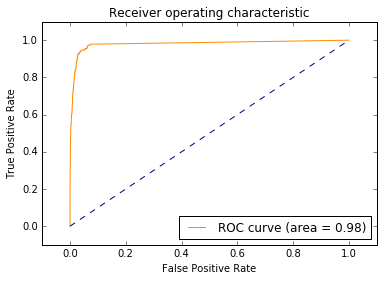


The misclassification rate for test dataset is 0.01906


In [166]:
#test dataset
rf_pred_test = rf_model.predict(x_tree_test)
rf_cm_test = confusion_matrix(y_tree_test, rf_pred_test)
TP = rf_cm_test[1][1]
FP = rf_cm_test[0][1]
TN = rf_cm_test[0][0]
FN = rf_cm_test[1][0]
print("The confusion matrix of test dataset (random forest):")
print("\t\t\t| predicted Positive \t| predicted Negative")
print("real Positive\t\t| "+str(TP)+"\t\t\t| "+str(FN))
print("real Negotiate\t\t| "+str(FP) +"\t\t\t| "+str(TN))

#ROC
fpr, tpr, thresholds = roc_curve(y_tree_test, rf_model.predict_proba(x_tree_test)[:,1])
print("\nThe ROC curve of random forest model for test dataset is as follows, and the AUC = %.2f"% auc(fpr,tpr))
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % auc(fpr,tpr))
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# misclassification rate
mis_rate_test = 1 - rf_model.score(x_tree_test, y_tree_test)
print("\nThe misclassification rate for test dataset is %.5f" % mis_rate_test)

In [170]:
#OOB error vs. test error
rf_oob_err = 1 - rf_model.oob_score_ 
rf_test_err = 1 - rf_model.score(x_tree_test, y_tree_test)
print("The Out of Bag error for random forest model is %.5f, while the test error is %.5f" %(rf_oob_err,rf_test_err))

The Out of Bag error for random forest model is 0.01410, while the test error is 0.01906


### 3.3 Random forest using imbalanced improvement (2d)

The confusion matrix of training dataset (random forest handling imbalanced dataset):
			| predicted Positive 	| predicted Negative
real Positive		| 947			| 53
real Negotiate		| 3799			| 55201

The ROC curve of random forest model (handling imbalanced dataset) for training dataset is as follows, and the AUC = 0.98


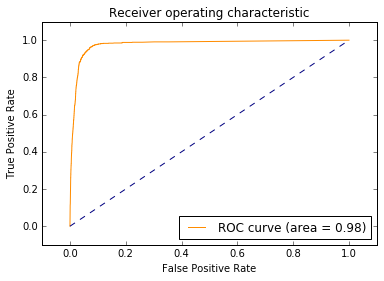


The misclassification rate for training dataset (handling imbalanced dataset) is 0.06420


In [174]:
# 2d
rf_model_balance = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0, oob_score=True,class_weight="balanced")
rf_model_balance.fit(x_tree_train, y_tree_train)

#training dataset
rf_pred_train_balance = rf_model_balance.predict(x_tree_train)
#Confusion matrix
rf_cm_train_balance = confusion_matrix(y_tree_train, rf_pred_train_balance)
TP = rf_cm_train[1][1]
FP = rf_cm_train[0][1]
TN = rf_cm_train[0][0]
FN = rf_cm_train[1][0]
print("The confusion matrix of training dataset (random forest handling imbalanced dataset):")
print("\t\t\t| predicted Positive \t| predicted Negative")
print("real Positive\t\t| "+str(TP)+"\t\t\t| "+str(FN))
print("real Negotiate\t\t| "+str(FP) +"\t\t\t| "+str(TN))

#ROC
fpr, tpr, thresholds = roc_curve(y_tree_train, rf_model_balance.predict_proba(x_tree_train)[:,1])
print("\nThe ROC curve of random forest model (handling imbalanced dataset) for training dataset is as follows, and the AUC = %.2f"% auc(fpr,tpr))
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % auc(fpr,tpr))
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# misclassification rate
mis_rate_train_balance = 1 - rf_model_balance.score(x_tree_train, y_tree_train)
print("\nThe misclassification rate for training dataset (handling imbalanced dataset) is %.5f" % mis_rate_train_balance)

The confusion matrix of test dataset (random forest handling imbalanced dataset):
			| predicted Positive 	| predicted Negative
real Positive		| 71			| 304
real Negotiate		| 1			| 15624

The ROC curve of random forest model (handling imbalanced dataset) for test dataset is as follows, and the AUC = 0.98


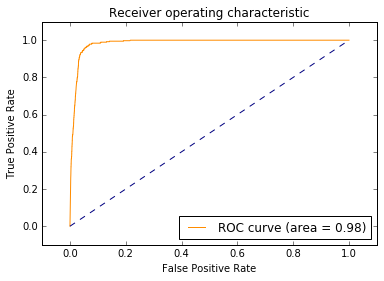


The misclassification rate for test dataset (handling imbalanced dataset) is 0.06019


In [175]:
#test dataset
rf_pred_test_balance = rf_model_balance.predict(x_tree_test)
rf_cm_test_balance = confusion_matrix(y_tree_test, rf_pred_test_balance)
TP = rf_cm_test[1][1]
FP = rf_cm_test[0][1]
TN = rf_cm_test[0][0]
FN = rf_cm_test[1][0]
print("The confusion matrix of test dataset (random forest handling imbalanced dataset):")
print("\t\t\t| predicted Positive \t| predicted Negative")
print("real Positive\t\t| "+str(TP)+"\t\t\t| "+str(FN))
print("real Negotiate\t\t| "+str(FP) +"\t\t\t| "+str(TN))

#ROC
fpr, tpr, thresholds = roc_curve(y_tree_test, rf_model_balance.predict_proba(x_tree_test)[:,1])
print("\nThe ROC curve of random forest model (handling imbalanced dataset) for test dataset is as follows, and the AUC = %.2f"% auc(fpr,tpr))
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % auc(fpr,tpr))
plt.plot([0, 1], [0, 1], color='navy',  linestyle='--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# misclassification rate
mis_rate_test_balance = 1 - rf_model_balance.score(x_tree_test, y_tree_test)
print("\nThe misclassification rate for test dataset (handling imbalanced dataset) is %.5f" % mis_rate_test_balance)

In [176]:
#OOB error vs. test error
rf_oob_err_balance = 1 - rf_model_balance.oob_score_ 
rf_test_err_balance = 1 - rf_model_balance.score(x_tree_test, y_tree_test)
print("The Out of Bag error for random forest model handling imbalanced dataset is %.5f, while the test error is %.5f" %(rf_oob_err_balance,rf_test_err_balance))

The Out of Bag error for random forest model handling imbalanced dataset is 0.06428, while the test error is 0.06019


#### Summary
The random forest addressing part of the imbalanced data by assign weights for each class based on the size of each class. From the result, the result of model handling imbalanced dataset improves slightly. The misclassification rate of positive data decreases while that of negative data increases.

### 3.4 Model Trees (2e)

In [1]:
#2e model trees
from weka.classifiers import Classifiers

SyntaxError: invalid syntax (classifiers.py, line 2169)